# Proyecto aplicado de Machine Learning. Nivel Intermedio

El objetivo de este proyecto es predecir la variable **area** (area quemada de baosque) en base al resto de caracteristicas asociadas al estado del bosque y contexto. Para más informacion https://www.kaggle.com/elikplim/forest-fires-data-set

Por tanto es un modelo de regresion de aprendizaje supervisado


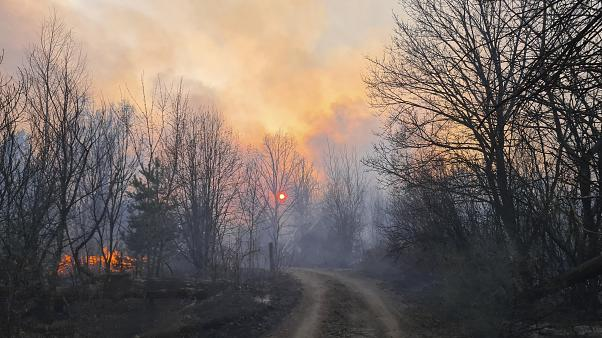

## Importación y limpieza de los datos

In [257]:
import pandas as pd
import numpy as np
#jupyter nbextension install --py luxwidget
#jupyter nbextension enable --py luxwidget

import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing  import LabelEncoder
import matplotlib.pyplot as plt


# Stats
from scipy.stats import skew, norm
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

In [307]:

path = 'forestfires.csv'
data = pd.read_csv(path, sep=",")

In [260]:
data.head()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0


In [261]:
data.describe()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292
std,2.313778,1.229900,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818
min,1.000000,2.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000
25%,3.000000,4.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000
50%,4.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000
75%,7.000000,5.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000
max,9.000000,9.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000


In [262]:
numerical = []
categorical = []

for y in data.columns:
    if(data[y].dtype == np.float64 or data[y].dtype == np.int64):
          numerical.append(y)
    else:
          categorical.append(y)

In [263]:
numerical

['X', 'Y', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'rain', 'area']

In [264]:
categorical

['month', 'day']

In [265]:

from pandas_profiling import ProfileReport
profile = ProfileReport(data, title="Pandas Profiling Report")
profile

C:\Users\Leyre\anaconda3\lib\site-packages\seaborn\axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


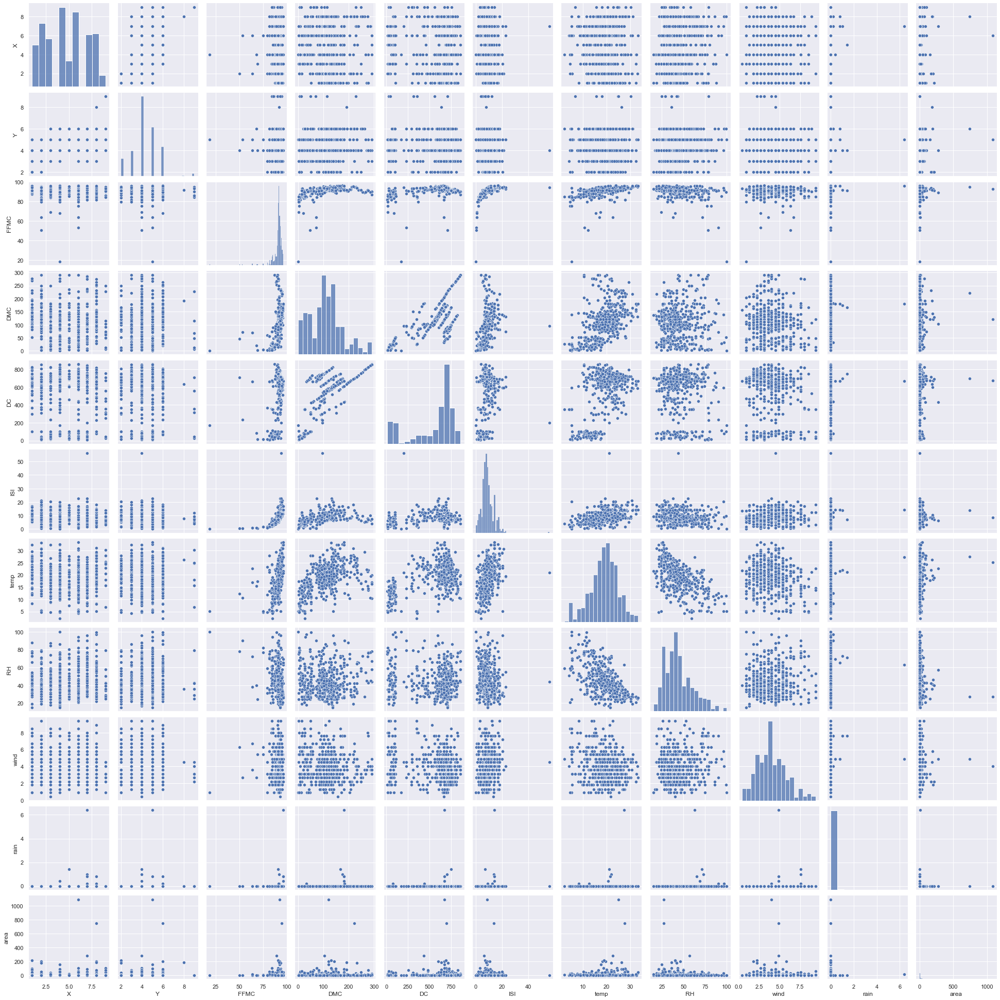

In [266]:
#scatterplot
sns.set()
cols = numerical
sns.pairplot(data[cols], size = 2.5)
plt.show()

In [267]:
print('months', data.month.value_counts(), sep='\n')

months
aug    184
sep    172
mar     54
jul     32
feb     20
jun     17
oct     15
apr      9
dec      9
may      2
jan      2
nov      1
Name: month, dtype: int64


In [268]:
months_to_remove = ['nov','jan','may']
data = data.drop(data[data.month.isin(months_to_remove)].index ,axis=0)
data.month.value_counts()

aug    184
sep    172
mar     54
jul     32
feb     20
jun     17
oct     15
apr      9
dec      9
Name: month, dtype: int64

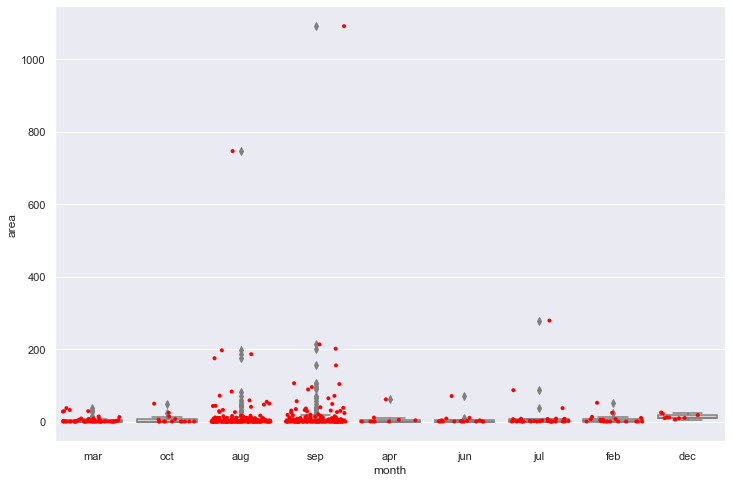

In [269]:
#December had a few incidents but all on the higher burnt area side. Is it becuase dry weather or because more tourists? 
ax = plt.figure(figsize=(12,8))
ax = sns.boxplot(x='month', y='area', data=data, color='lightgrey', )
ax = sns.stripplot(x='month', y='area', data=data, color='red', jitter=0.4, size=4)

## PRE-PROCESAMIENTO 

## Tratamiento de valores faltantes

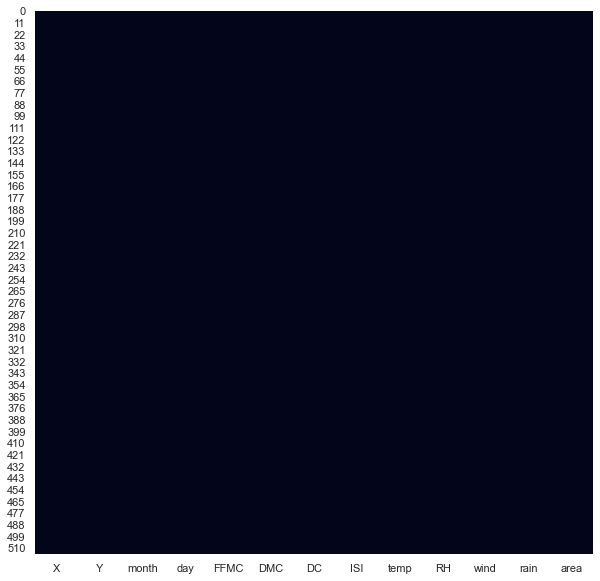

In [270]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
sns.heatmap(data.isnull(), cbar=False);

### Tratamiento de variables categóricas

#### One-hot encoding

In [271]:
# Pasamos las variables categoricas a numericas 
data = pd.get_dummies(data).reset_index(drop=True)

In [272]:
data.head()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,month_mar,month_oct,month_sep,day_fri,day_mon,day_sat,day_sun,day_thu,day_tue,day_wed
0,7,5,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,1,0,0,1,0,0,0,0,0,0
1,7,4,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,1,0,0,0,0,0,0,1,0
2,7,4,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,1,0,0,0,1,0,0,0,0
3,8,6,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,1,0,0,1,0,0,0,0,0,0
4,8,6,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,1,0,0,0,0,0,1,0,0,0


### Transformaciones numéricas

#### Eliminacion outliers

In [273]:
#remove outliers
data=data.drop(data[data.area>100].index,axis=0)

#### Transformacion logaritmica

In [274]:
# transformaciones numéricas
ori_area = data['area'] 
data['area'] = np.log(data['area'] + 1)

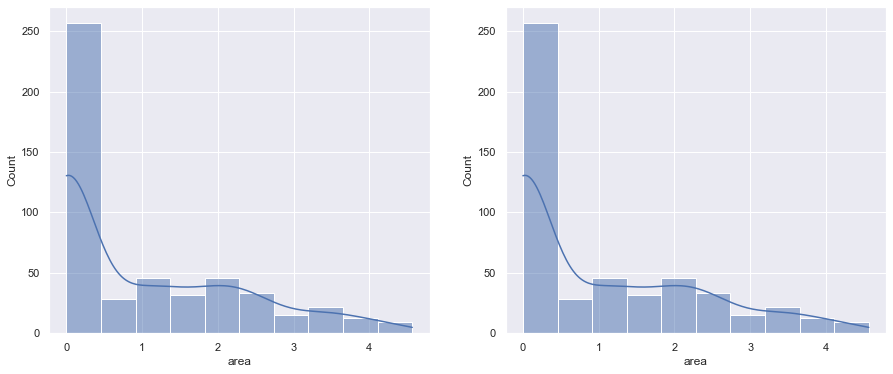

In [275]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))

sns.histplot(ori_area, ax=ax1, kde=True)
sns.histplot(data['area'], ax=ax2, kde=True);

#### Corregir distribucion (cutorsis)

In [276]:
# Find skewed numerical features
skew_features = data[numerical].apply(lambda x: skew(x)).sort_values(ascending=False)

high_skew = skew_features[skew_features > 0.5]
skew_index = high_skew.index

print("There are {} numerical features with Skew > 0.5 :".format(high_skew.shape[0]))
skewness = pd.DataFrame({'Skew' :high_skew})
skew_features.head(7)

There are 6 numerical features with Skew > 0.5 :


rain    19.448759
ISI      2.582826
area     0.965998
RH       0.797542
DMC      0.570670
wind     0.568398
Y        0.417003
dtype: float64

#### Normalización

In [277]:
data[skew_index] = MinMaxScaler().fit_transform(data[skew_index])

## Pipelines

##### Configuración del Pipeline

In [278]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

categorical_attributes = list(data.select_dtypes(include=['object']).columns)
numerical_attributes = list(data.select_dtypes(include=['float64', 'int64']).columns)

numerical_transformer = Pipeline([('imputer', SimpleImputer(strategy='median')),       
                         ('std_scaler', StandardScaler())
                        ])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
                        ('imputer', SimpleImputer(strategy='most_frequent')),
                        ('onehot', OneHotEncoder(handle_unknown='ignore'))
])


preprocessor = ColumnTransformer(remainder='passthrough',
                                  transformers=[
                                  ('drop_attributes', 'drop', ['X','Y','area']), 
                                  ('num', numerical_transformer, numerical_attributes),
                                  ('cat', categorical_transformer, categorical_attributes),
                                  ])


 

#### Aplicar el Pipeline

In [280]:
## Split de los datos en train y test
from sklearn.model_selection import train_test_split


X = data
y = data['area']

X = full_pipeline.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

## Validación cruzada 

#### RandomForest

In [283]:
from sklearn.ensemble import RandomForestRegressor

rf_reg = RandomForestRegressor()
rf_reg.fit(X_train, y_train)

area_predictions = rf_reg.predict(X_train)
rf_mse = mean_squared_error(y_train, area_predictions)
rf_rmse = np.sqrt(rf_mse)
print('RMSE Random Forest', rf_rmse) #model is overfitting 



RMSE Random Forest 0.0024731237825028553


In [291]:
def explain_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())

In [292]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(rf_reg, X_train, y_train,
                         cv=10,
                         scoring='neg_mean_squared_error')


rf_rmse_scores = np.sqrt(-scores)
explain_scores(rf_rmse_scores)

Scores: [0.00553231 0.00548679 0.00658516 0.00507799 0.00374549 0.01646719
 0.00759997 0.00202579 0.00432789 0.00525778]
Mean: 0.006210636896531918
Standard deviation: 0.0037091354130445913


#### XGBoost

In [295]:
from xgboost import XGBRegressor
xgb_reg = XGBRegressor()

scores = cross_val_score(xgb_reg, X_train, y_train,
                         cv=10,
                         scoring='neg_mean_squared_error')


xgb_rmse_scores = np.sqrt(-scores)
explain_scores(xgb_rmse_scores)

[19:29:19] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:29:19] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:29:19] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:29:19] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:29:19] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:29:19] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:29:19] WARNI

## XGBoost y Ajuste de hiperparámetros

In [298]:
# Look at parameters used by our current forest
from pprint import pprint
print('Parameters currently in use:\n')
pprint(xgb_reg.get_params())

Parameters currently in use:

{'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'gamma': 0,
 'importance_type': 'gain',
 'learning_rate': 0.1,
 'max_delta_step': 0,
 'max_depth': 3,
 'min_child_weight': 1,
 'missing': None,
 'n_estimators': 100,
 'n_jobs': 1,
 'nthread': None,
 'objective': 'reg:linear',
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': 1,
 'seed': None,
 'silent': None,
 'subsample': 1,
 'verbosity': 1}


#### GridSearchCV

In [299]:
from sklearn.model_selection import GridSearchCV

# Create the parameter grid
param_grid = {'objective':['reg:linear'],
              'learning_rate': [0.02,0.03,0.04], 
              'max_depth': [1,2],
              'min_child_weight': [2,3,4],
              'silent': [1],
              'subsample': [0.8],
              'colsample_bytree': [0.2,0.3,0.4],
              'n_estimators': [50,60,70,100]}

# Instantiate the grid search model
grid_search = GridSearchCV(estimator = xgb_reg, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [300]:
# Fit the grid search to the data
grid_search.fit(X_train, y_train)
grid_search.best_params_

Fitting 3 folds for each of 216 candidates, totalling 648 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 370 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done 648 out of 648 | elapsed:   15.0s finished


{'colsample_bytree': 0.4,
 'learning_rate': 0.04,
 'max_depth': 2,
 'min_child_weight': 4,
 'n_estimators': 100,
 'objective': 'reg:linear',
 'silent': 1,
 'subsample': 0.8}

### Evaluación del modelo

In [304]:
from sklearn import metrics
print('Metrics of train')
y_pred=grid_search.predict(X_train)

print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred)))


Metrics of train
Mean Absolute Error: 0.05032979426026589
Mean Squared Error: 0.0038084732872648514
Root Mean Squared Error: 0.061712829195110244


In [305]:
from sklearn import metrics
print('Metrics of test')
y_pred=grid_search.predict(X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Metrics of test
Mean Absolute Error: 0.057661336098887635
Mean Squared Error: 0.0050515420913167484
Root Mean Squared Error: 0.07107420130621764


In [306]:
from sklearn import metrics
print('Metrics of validation')
y_pred=grid_search.predict(X_val)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_val, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_val, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_val, y_pred)))

Metrics of validation
Mean Absolute Error: 0.06061960135684727
Mean Squared Error: 0.0064890286496273545
Root Mean Squared Error: 0.08055450732036883
